<br>
<img src="data/uber_logo.png" alt="Logo de Uber" style="width:300px"/><br>

# **Uber NYC Analysis & Clustering**<br>

### 👨‍💻 Jorge Gómez Galván
* LinkedIn: [linkedin.com/in/jorgeggalvan/](https://www.linkedin.com/in/jorgeggalvan/)
* E-mail: ggalvanjorge@gmail.com

---
## **Análisis y visualización de datos geoespaciales**

In [1]:
# Importación de librerías
import pandas as pd
import geopandas as gpd

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker
from matplotlib.lines import Line2D
import seaborn as sns
import plotly.express as px

import folium
from folium.plugins import HeatMapWithTime

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Lectura del dataset
df_uber = pd.read_csv('./data/uber_data_transformed.csv')
df_uber = df_uber.drop('Unnamed: 0', axis='columns') # Eliminación de columnas irrelevantes

# Conversión de fecha a tipo datetime
df_uber['date'] = pd.to_datetime(df_uber['date'])

# Creación de columna para facilitar las agrupaciones
df_uber['n_picks'] = 1

df_uber.head()

,date_time,date,n_month,month,n_week,n_day_week,day_week,weekend,day,hour,minute,lat,lon,base,nbhood,borough,n_picks
0,2014-04-01 00:11:00,2014-04-01,4,abr,14,2,mar,no,1,0,11,40.7690,-73.9549,B02512,Lenox Hill-Roosevelt Island,Manhattan,1
1,2014-04-01 00:17:00,2014-04-01,4,abr,14,2,mar,no,1,0,17,40.7267,-74.0345,B02512,SoHo-TriBeCa-Civic Center-Little Italy,Manhattan,1
2,2014-04-01 00:21:00,2014-04-01,4,abr,14,2,mar,no,1,0,21,40.7316,-73.9873,B02512,East Village,Manhattan,1
3,2014-04-01 00:28:00,2014-04-01,4,abr,14,2,mar,no,1,0,28,40.7588,-73.9776,B02512,Midtown-Midtown South,Manhattan,1
4,2014-04-01 00:33:00,2014-04-01,4,abr,14,2,mar,no,1,0,33,40.7594,-73.9722,B02512,Turtle Bay-East Midtown,Manhattan,1


In [3]:
# Lectura del geodataframe  con la información geográfica de los distritos de NYC
gdf_nyc_boroughs = gpd.read_file('./data/nyc_boroughs.shp')

gdf_nyc_boroughs

,borocode,borough,population,area_sqft,geometry
0,1.0,Manhattan,1618398,6.365056e+08,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ..."
1,2.0,The Bronx,1413566,1.186965e+09,"MULTIPOLYGON (((-73.89681 40.79581, -73.89694 ..."
2,3.0,Brooklyn,2570801,1.937582e+09,"MULTIPOLYGON (((-73.86706 40.58209, -73.86769 ..."
3,4.0,Queens,2280602,3.045170e+09,"MULTIPOLYGON (((-73.83668 40.59495, -73.83678 ..."
4,5.0,Staten Island,471522,1.623827e+09,"MULTIPOLYGON (((-74.05051 40.56642, -74.05047 ..."


In [4]:
# Lectura del geodataframe  con la información geográfica de los barrios de NYC
gdf_nyc_nbhoods = gpd.read_file('./data/nyc_neighborhoods.shp')

gdf_nyc_nbhoods.head()

,boro_code,borough,nbhood,population,area_sqft,geometry
0,1.0,Manhattan,Battery Park City-Lower Manhattan,38015,1.901167e+07,"MULTIPOLYGON (((-74.00078 40.69429, -74.00096 ..."
1,1.0,Manhattan,Central Harlem North-Polo Grounds,79254,2.540303e+07,"POLYGON ((-73.93445 40.83598, -73.93447 40.835..."
2,1.0,Manhattan,Central Harlem South,47328,1.444123e+07,"POLYGON ((-73.94177 40.80709, -73.94226 40.806..."
3,1.0,Manhattan,Chinatown,47182,1.450188e+07,"POLYGON ((-73.98382 40.72147, -73.98386 40.721..."
4,1.0,Manhattan,Clinton,43514,1.837385e+07,"POLYGON ((-73.99383 40.77293, -73.99379 40.772..."


In [5]:
# Funciones para configurar el formato de las etiquetas de los ejes 

# Formato con separador de miles
def format_labels_sep(x, pos):
    return '{:,.0f}'.format(x).replace(',', '.')

# Formato de miles (K)
def format_labels_k(x, pos):
    if x >= 1e3: return '{:,.0f}K'.format(x * 1e-3).replace(',', '.')
    elif x == 0: return '0K'
    else: return '{:,.1f}K'.format(x * 1e-3).replace(',', '.')

# Formato de millones (M)
def format_labels_m(x, pos):
    if x >= 1e6 and x % 1e6 == 0: return '{}M'.format('{:,.0f}'.format(x * 1e-6).replace(',', '.'))
    elif x == 0: return '0M'
    else: return '{}M'.format('{:,.1f}'.format(x * 1e-6).replace(',', '.'))

---
### **1 - Análisis de viajes por coordenadas**

#### 1.1 - Coordenadas geográficas de todos los viajes

In [6]:
# Paleta de colores
borough_cmap = {'Manhattan':'#7356BF', 'Brooklyn':'#FFC043', 'Queens':'#276EF1', 'The Bronx':'#ED6E33', 'Staten Island':'#3AA76D'}

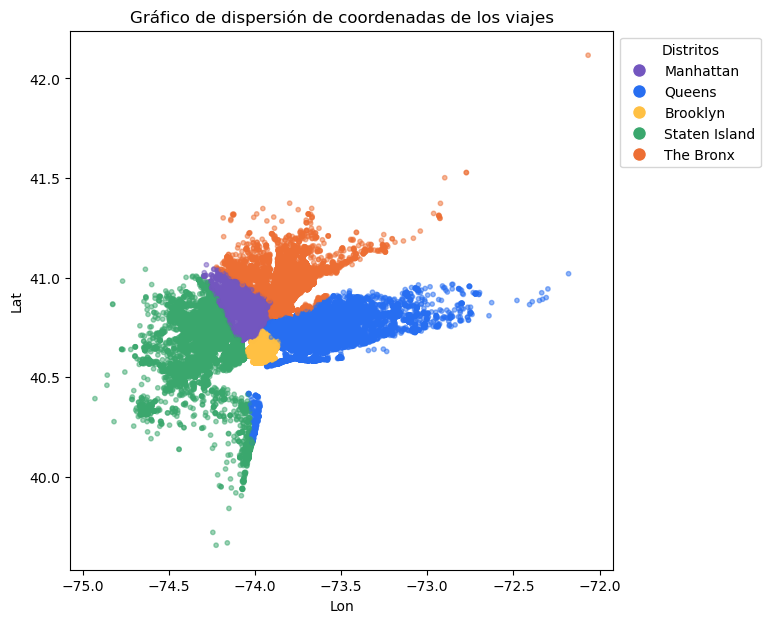

In [7]:
plt.subplots(figsize=(7, 7)) # Ajuste del tamaño del gráfico

# Gráfico de dispersión de las coordenadas de cada viaje
scatter = plt.scatter(x=df_uber['lon'], y=df_uber['lat'], c=[borough_cmap[name] for name in df_uber['borough']], alpha=0.5, s=10)

# Título y etiquetas de los ejes
plt.title('Gráfico de dispersión de coordenadas de los viajes')
plt.xlabel('Lon')
plt.ylabel('Lat')

# Leyenda
legend_markers = [Line2D([0], [0], marker='o', markersize=10, color='w', markerfacecolor=borough_cmap[name], label=name) for name in df_uber['borough'].unique()]
plt.legend(handles=legend_markers, title='Distritos', loc='upper left', bbox_to_anchor=(1, 1))

plt.show()

#### 1.2 - Mapa de calor de viajes por día de la semana

In [8]:
# Lista vacía para almacenar las coordenadas por día de la semana
picks_week = []

# Bucle para obtener las coordenadas de cada día de la semana
for n_day_week in df_uber.n_day_week.sort_values().unique():
    
    # Datos filtrados de las coordenadas para cada día de la semana
    picks_week.append(df_uber.loc[df_uber.n_day_week == n_day_week, ['lat','lon','n_picks']].groupby(['lat', 'lon']).sum().reset_index().values.tolist())

In [9]:
fig = folium.Figure(width=1000, height=500) # Ajuste del tamaño del mapa

# Creación de mapa
map_picks_week = folium.Map(location=[df_uber['lat'].mean(), df_uber['lon'].mean()], control_scale=True, zoom_start=12)

# Mapa de calor de viajes por día de la semana
HeatMapWithTime(picks_week, radius=5, gradient={0.2:'blue', 0.4:'lime', 0.6:'orange', 1:'red'}, use_local_extrema=True).add_to(map_picks_week)

map_picks_week.add_to(fig)

<div style="border: 5px solid #000000; padding: 20px; font-size: 16px; background-color: rgba(0, 0, 0, 0.1);">
⚠ Representación disponible en <a href="https://github.com/jorgeggalvan/Uber-NYC-Analysis-and-Clustering/blob/main/heatmap/picks_by_day_week.gif">github.com/jorgeggalvan/Uber-NYC-Analysis-and-Clustering/blob/main/heatmap/picks_by_day_week.gif</a>
</div>

<div style="border: 5px solid #000000; padding: 20px; font-size: 16px; background-color: rgba(0, 0, 0, 0.1);">
El mapa de calor del total de viajes por día de la semana revela un patrón interesante: los sábados existe una tendencia en la que la población tiende a viajar hacia las afueras de la ciudad. Este tipo de información podría ayudar a Uber a reubicar de manera estratégica su flota con el objetivo de atender de manera más efectiva toda su demanda.
</div>

#### 1.3 - Mapa de calor de viajes por hora

In [10]:
# Lista vacía para almacenar las coordenadas por hora
picks_hour = []

# Bucle para obtener las coordenadas de cada hora
for hour in df_uber.hour.sort_values().unique():

    # Datos filtrados de las coordenadas para cada hora
    picks_hour.append(df_uber.loc[df_uber.hour == hour, ['lat','lon','n_picks']].groupby(['lat','lon']).sum().reset_index().values.tolist())

In [11]:
fig = folium.Figure(width=1000, height=500) # Ajuste del tamaño del mapa

# Creación de mapa
map_picks_hour = folium.Map(location=[df_uber['lat'].mean(), df_uber['lon'].mean()], control_scale=True, zoom_start=12)

# Mapa de calor de viajes por hora
HeatMapWithTime(picks_hour, radius=5, gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'orange', 1: 'red'}, use_local_extrema=True).add_to(map_picks_hour)

map_picks_hour.add_to(fig)

<div style="border: 5px solid #000000; padding: 20px; font-size: 16px; background-color: rgba(0, 0, 0, 0.1);">
⚠ Representación disponible en <a href="https://github.com/jorgeggalvan/Uber-NYC-Analysis-and-Clustering/blob/main/heatmap/picks_by_hour.gif">github.com/jorgeggalvan/Uber-NYC-Analysis-and-Clustering/blob/main/heatmap/picks_by_hour.gif</a>
</div>

---
### **2 - Análisis de viajes por distrito**

#### 2.1 - Distribución del total y la media diaria de viajes por distrito

In [12]:
# Total de viajes al día por distrito
uber_borough_day = df_uber.groupby(['borough','date']).agg({'n_picks':'sum'}).reset_index()

# Total y media diaria de viajes por distrito
uber_borough = uber_borough_day.groupby('borough').agg(total_picks=('n_picks','sum'), mean_picks=('n_picks','mean')).round(2)
uber_borough = uber_borough.sort_values(by='total_picks', ascending=False).reset_index()

uber_borough

,borough,total_picks,mean_picks
0,Manhattan,3491442,19078.92
1,Brooklyn,593693,3244.22
2,Queens,359079,1962.18
3,Staten Island,45258,247.31
4,The Bronx,44855,245.11


In [13]:
# Combinación con el geodataframe de distritos
uber_borough = gdf_nyc_boroughs[['borough','population','area_sqft','geometry']].merge(uber_borough, how='left', left_on='borough', right_on='borough')
uber_borough = uber_borough.sort_values(by='total_picks', ascending=False)

In [14]:
# Número total de viajes
total_picks = df_uber['n_picks'].sum()

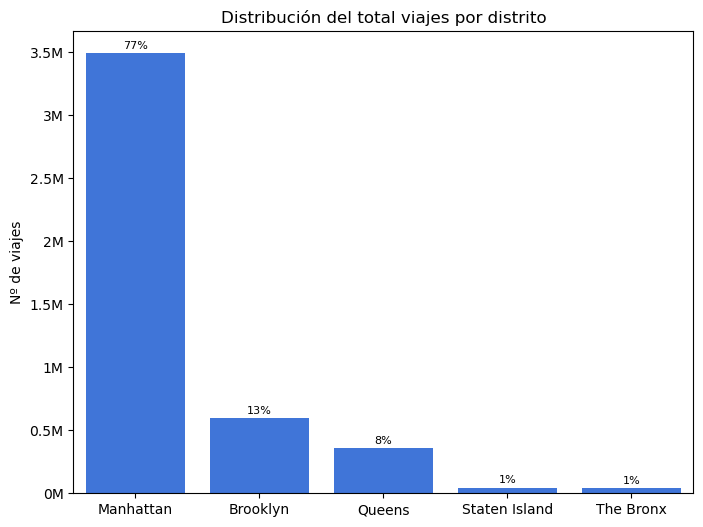

In [15]:
fig, ax = plt.subplots(figsize=(8, 6)) # Ajuste del tamaño del gráfico

# Gráficos de barras con el total de viajes por mes
sns.barplot(x='borough', y='total_picks', data=uber_borough, color='#276EF1')

# Título y etiquetas de los ejes
plt.title('Distribución del total viajes por distrito')
plt.xlabel(None)
plt.ylabel('Nº de viajes')
# Formato del eje y
ax.yaxis.set_major_formatter(ticker.FuncFormatter(format_labels_m))

# Etiquetas del porcentaje de viajes por distrito
for bar in ax.containers[0]:
    
    # Cálculo del porcentaje de viajes por distrito
    per_picks = (bar.get_height() / total_picks) * 100
    
    # Anotación de la etiqueta en la barra
    ax.annotate(f'{per_picks:.0f}%', xy=(bar.get_x() + bar.get_width() / 2, bar.get_height()), xytext=(0, 3), textcoords='offset points', ha='center', fontsize=8)

plt.show()

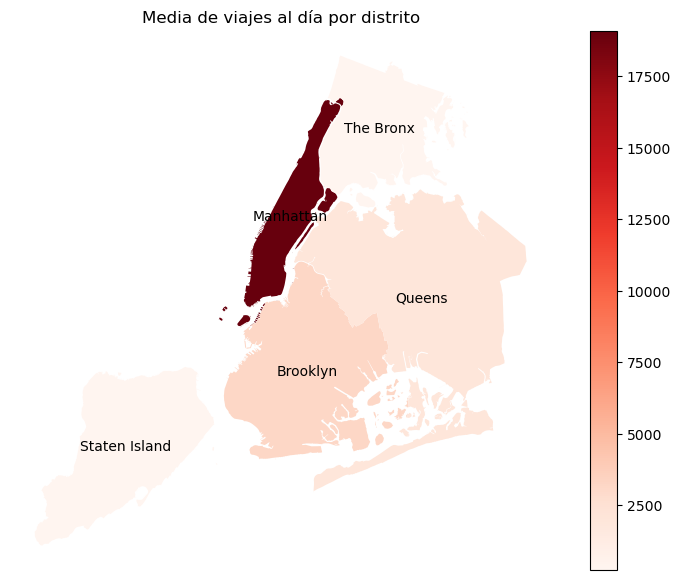

In [16]:
fig, ax = plt.subplots(figsize=(10, 7)) # Ajuste del tamaño del gráfico

# Mapa con la media diaria de viajes por distrito
uber_borough.plot(column='mean_picks', cmap='Reds', legend=True, ax=ax)

# Título del gráfico
plt.title('Media de viajes al día por distrito')

# Eliminación del eje x e y
plt.axis('off')

# Bucle para agregar etiquetas en los distritos
for x, y, label in zip(uber_borough.geometry.centroid.x, uber_borough.geometry.centroid.y, uber_borough['borough']):
    ax.text(x, y, label, fontsize=10, ha='center', va='center')

plt.show()

<div style="border: 5px solid #000000; padding: 20px; font-size: 16px; background-color: rgba(0, 0, 0, 0.1);">
Es evidente que la mayor parte de la actividad de Uber en la ciudad de Nueva York se concentra en Manhattan, representando aproximadamente el 77% del total de recogidas, lo que confirma la fuerte demanda y el gran posicionamiento de la compañía en Manhattan en comparación con otros distritos.
<br><br>
Dado que los otros distritos (Brooklyn, Queens, Staten Island y The Bronx) representan una proporción significativamente menor, podría ser una estrategia positiva considerar acciones de captación y marketing enfocadas en estos distritos. Esto podría incluir campañas publicitarias específicas, promociones exclusivas y otros esfuerzos para aumentar la conciencia y la disponibilidad de los servicios de Uber en esas áreas de cara a expandir su base de usuarios y aprovechar nuevas oportunidades de mercado en Nueva York.
</div>

#### 2.2 - Comparativa de la media diaria de viajes por distrito en días de la semana vs. en fin de semana

In [17]:
# Total de viajes al día por distrito
uber_borough_weekend_date = df_uber.groupby(['borough','date','weekend']).agg({'n_picks':'sum'}).reset_index()

# Total y media diaria de viajes por distrito
uber_borough_weekend = uber_borough_weekend_date.groupby(['borough','weekend']).agg(total_picks=('n_picks','sum'), mean_picks=('n_picks','mean')).round(0)
uber_borough_weekend = uber_borough_weekend.reset_index()

uber_borough_weekend

,borough,weekend,total_picks,mean_picks
0,Brooklyn,no,287533,2738.0
1,Brooklyn,yes,306160,3925.0
2,Manhattan,no,2117987,20171.0
3,Manhattan,yes,1373455,17608.0
4,Queens,no,200437,1909.0
5,Queens,yes,158642,2034.0
6,Staten Island,no,26800,255.0
7,Staten Island,yes,18458,237.0
8,The Bronx,no,24137,230.0
9,The Bronx,yes,20718,266.0


In [18]:
# Combinación con el geodataframe de distritos
uber_borough_weekend = gdf_nyc_boroughs[['borough','geometry']].merge(uber_borough_weekend, how='left', left_on='borough', right_on='borough')

In [19]:
# Media de viajes máxima
max_picks = uber_borough_weekend['mean_picks'].max()

In [20]:
# Dataframes para los días de la semana y de fin de semana
uber_borough_no_weekend = uber_borough_weekend[uber_borough_weekend['weekend'] == 'no']
uber_borough_weekend = uber_borough_weekend[uber_borough_weekend['weekend'] == 'yes']

In [21]:
# Total de viajes durante la semana y el fin de semana
total_picks_no_weekend = uber_borough_no_weekend['total_picks'].sum()
total_picks_weekend = uber_borough_weekend['total_picks'].sum()

# Porcentaje de viajes durante la semana y el fin de semana
uber_borough_no_weekend['per_picks'] = uber_borough_no_weekend['total_picks'] / total_picks_no_weekend
uber_borough_weekend['per_picks'] = uber_borough_weekend['total_picks'] / total_picks_weekend

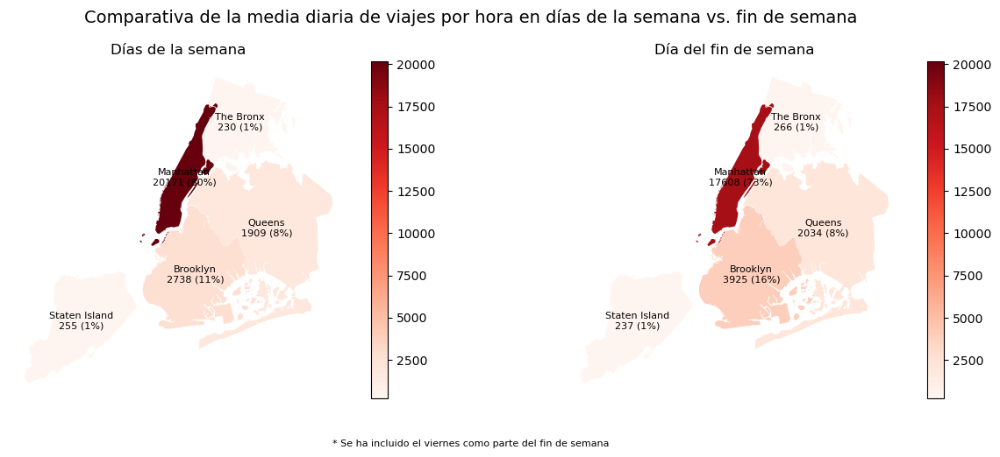

In [22]:
# Figura con 2 subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Título del subplot
plt.suptitle('Comparativa de la media diaria de viajes por hora en días de la semana vs. fin de semana', y=1, fontsize=14)

# Mapa con la media diaria de viajes por distrito durante la semana
uber_borough_no_weekend.plot(column='mean_picks', cmap='Reds', legend=True, vmax=max_picks, ax=axs[0])
axs[0].set_title('Días de la semana')
axs[0].axis('off')

# Bucle para agregar etiquetas en los distritos
for x, y, label, mean_pick, per_pick in zip(uber_borough_no_weekend.geometry.centroid.x, uber_borough_no_weekend.geometry.centroid.y, uber_borough_no_weekend['borough'], uber_borough_no_weekend['mean_picks'], uber_borough_no_weekend['per_picks']*100):
    axs[0].text(x, y, f'{label}\n{mean_pick:.0f} ({per_pick:.0f}%)', fontsize=8, ha='center', va='center')

# Mapa con la media diaria de viajes por distrito durante el fin de semana
uber_borough_weekend.plot(column='mean_picks', cmap='Reds', legend=True, vmax=max_picks, ax=axs[1])
axs[1].set_title('Día del fin de semana')
axs[1].axis('off')

# Bucle para agregar etiquetas en los distritos
for x, y, label, mean_pick, per_pick in zip(uber_borough_weekend.geometry.centroid.x, uber_borough_weekend.geometry.centroid.y, uber_borough_weekend['borough'], uber_borough_weekend['mean_picks'], uber_borough_weekend['per_picks']*100):
    axs[1].text(x, y, f'{label}\n{mean_pick:.0f} ({per_pick:.0f}%)', fontsize=8, ha='center', va='center')
    
plt.text(s="* Se ha incluido el viernes como parte del fin de semana", x=0.5, y=0, horizontalalignment='center', fontsize=8, transform=plt.gcf().transFigure)
plt.show()

<div style="border: 5px solid #000000; padding: 20px; font-size: 16px; background-color: rgba(0, 0, 0, 0.1);">
Al analizar la distribución de viajes en los cinco distritos entre días de la semana y días de fin de semana, se observa que la actividad de Manhattam disminuye ligeramente a final de semana, pasando a registrar un 80% de los viajes durante la semana laboral a un 73% los fines de semana. 
<br><br>    
Esta variación puede atribuirse a la demanda de transporte que existe durante la semana debido a la actividad laboral. Además, durante los fines de semana, la población local tiende a aumentar sus desplazamientos fuera de la ciudad o reduce su movilidad, optando en ocasiones por medios de transporte alternativos. Todo esto conlleva a una reducción de la necesidad de utilizar los servicios de Uber.
<br><br>
La disminución de viajes en Manhattan durante el fin de semana es mayoritariamente absorbida por Brooklyn, que experimenta un aumento en su actividad durante los fines de semana, de un 11% a un 16%. Dado que uno de los objetivos estratégicos podría ser expandirse al resto de distritos, podría ser interesante implementar una campaña de captación focalizada en Brooklyn durante esos días. Esta campaña podría incluir ofertas y promociones específicas para incentivar a más residentes y visitantes de Brooklyn a utilizar Uber durante los fines de semana.
<br><br>
Asimismo, se podría realizar un seguimiento cuidadoso de los patrones de uso de los nuevos usuarios captados durante el fin de semana para después diseñar estrategias personalizadas para retenerlos e incentivar el uso de Uber durante la semana laboral.
</div>

#### 2.3 - Relación entre la media diaria de viajes y la población por distrito

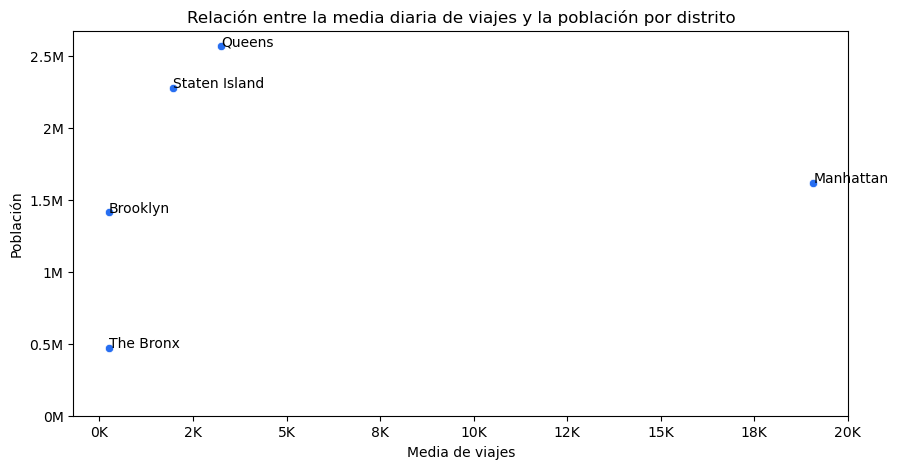

In [23]:
fig, ax = plt.subplots(figsize=(10, 5)) # Ajuste del tamaño del gráfico

# Gráfico de dispersión con la media diaria de viajes y la población por distrito
sns.scatterplot(x='mean_picks', y='population', data=uber_borough, color='#276EF1')

# Título y etiquetas de ejes
plt.title('Relación entre la media diaria de viajes y la población por distrito')
plt.xlabel('Media de viajes')
plt.ylabel('Población')
plt.ylim(bottom=0)
# Formato del eje x e y
ax.xaxis.set_major_formatter(ticker.FuncFormatter(format_labels_k))
ax.yaxis.set_major_formatter(ticker.FuncFormatter(format_labels_m))

# Bucle para agregar el distrito al que corresponde cada punto
for i, txt in enumerate(uber_borough['borough']):
    ax.annotate(txt, (uber_borough['mean_picks'][i], uber_borough['population'][i]))

plt.show()

<div style="border: 5px solid #000000; padding: 20px; font-size: 16px; background-color: rgba(0, 0, 0, 0.1);">
Cruzando los datos de población en cada uno de los distritos con la cantidad de viajes realizados, no se evidencia una correlación entre estos dos parámetros.
</div>

#### 2.4 - Relación entre la media diaria de viajes y el área por distrito

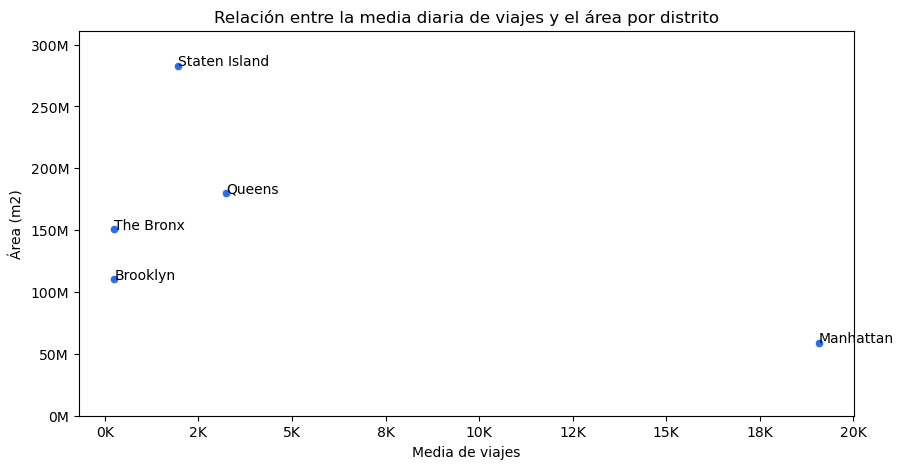

In [24]:
# Conversión de pies cuadrados a metros cuadrados
uber_borough['area_m2'] = uber_borough['area_sqft'] * 0.092903

fig, ax = plt.subplots(figsize=(10, 5)) # Ajuste del tamaño del gráfico

# Gráfico de dispersión con la media diaria de viajes y el área por distrito
sns.scatterplot(x='mean_picks', y='area_m2', data=uber_borough, color='#276EF1')

# Título y etiquetas de ejes
plt.title('Relación entre la media diaria de viajes y el área por distrito')
plt.xlabel('Media de viajes')
plt.ylabel('Área (m2)')
plt.ylim(0, max(uber_borough['area_m2']*1.1))
# Formato del eje x e y
ax.xaxis.set_major_formatter(ticker.FuncFormatter(format_labels_k))
ax.yaxis.set_major_formatter(ticker.FuncFormatter(format_labels_m))

# Bucle para agregar el distrito al que corresponde cada punto
for i, txt in enumerate(uber_borough['borough']):
    ax.annotate(txt, (uber_borough['mean_picks'][i], uber_borough['area_m2'][i]))

plt.show()

<div style="border: 5px solid #000000; padding: 20px; font-size: 16px; background-color: rgba(0, 0, 0, 0.1);">
Tampoco se aprecia una correlación clara entre el área y la media diaria de viajes por distrito. Por lo tanto, parece que otros factores influyen más en la cantidad de viajes en cada distrito que el tamaño del área y de la población en sí.
</div>

#### 2.5 - Comparativa del total de viajes mensuales en los 5 distritos

In [25]:
# Total de viajes por mes y por distrito
uber_borough_month = df_uber.groupby(['borough','n_month','month']).agg(total_picks=('n_picks','sum')).round(2)
uber_borough_month = uber_borough_month.sort_values(by=['n_month','total_picks'], ascending=[True,False]).reset_index()

In [26]:
# Nombres de los distritos
borough_names = ['Manhattan', 'Brooklyn', 'Queens', '', 'The Bronx', 'Staten Island']

# Paleta de colores
borough_colors = ['#7356BF', '#FFC043', '#276EF1', '', '#ED6E33', '#3AA76D']

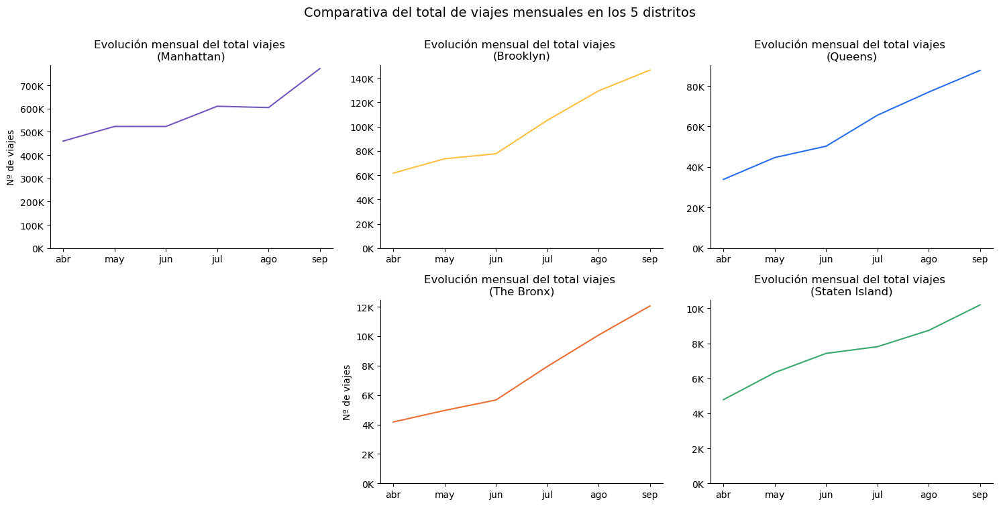

In [27]:
# Figura con 6 subplots
fig, axs = plt.subplots(2, 3, figsize=(15, 7.5))

# Título del subplot
plt.suptitle('Comparativa del total de viajes mensuales en los 5 distritos', y=1, fontsize=14)

# Bucle para obtener el total de viajes por mes para cada distrito
for i, borough in enumerate(borough_names):

    # Datos filtrados para cada distrito
    subset = uber_borough_month[uber_borough_month['borough'] == borough]
    
    # Selección del subplot correspondiente
    ax = axs[i // 3, i % 3]
    
    # Evitar dibujar en el cuarto subplot
    if borough == '':
        ax.axis('off')
        continue

    # Gráfico de líneas con el total de viajes por mes para cada distrito
    sns.lineplot(x='month', y='total_picks', data=subset, color=borough_colors[i], ax=ax)

    # Título y etiqueta de los ejes
    ax.set_title(f'Evolución mensual del total viajes \n({borough})')
    ax.set_xlabel(None)
    
    if borough in ('Manhattan', 'The Bronx'): ax.set_ylabel('Nº de viajes')
    else: ax.set_ylabel(None) 
    
    # Formato del eje y
    ax.set_ylim(bottom=0)
    ax.yaxis.set_major_formatter(plt.FuncFormatter(format_labels_k))

    sns.despine(ax=ax) # Eliminación de bordes

plt.tight_layout() # Ajuste del espaciado entre subplots
plt.show()

<div style="border: 5px solid #000000; padding: 20px; font-size: 16px; background-color: rgba(0, 0, 0, 0.1);">
A lo largo de todos meses, ha habido tendencia alcista en cuanto al crecimiento de los distritos en la cantidad de recogidas, con un aumento especialmente notable en Brooklyn, Queens, The Bronx y Staten Island.
<br><br>
Sin embargo, es interesante destacar que Manhattan, a pesar de ser la zona con la mayor actividad, ha tenido meses en los que la cantidad de viajes se ha mantenido relativamente estancada, sin un aumento significativo ni una disminución notable.
</div>

#### 2.6 - Comparativa del total de viajes por día de la semana en los 5 distritos

In [28]:
# Total de viajes al día por distrito
uber_borough_date = df_uber.groupby(['borough','n_day_week','day_week','date']).agg({'n_picks':'sum'}).reset_index()

# Total de viajes por día de la semana y por distrito
uber_borough_week = uber_borough_date.groupby(['borough','n_day_week','day_week']).agg(total_picks=('n_picks','sum'), mean_picks=('n_picks','mean')).round(2)
uber_borough_week = uber_borough_week.sort_values(by=['n_day_week','mean_picks'], ascending=[True,False]).reset_index()

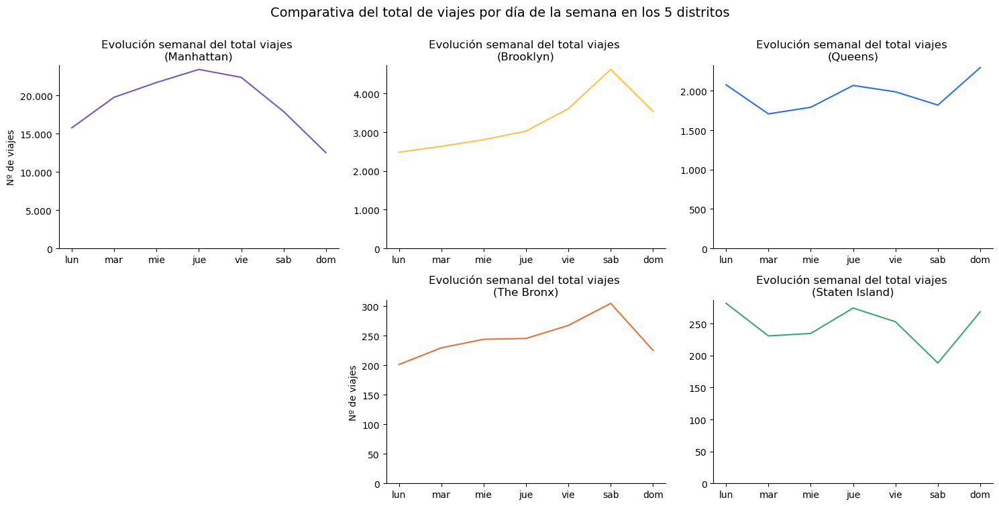

In [29]:
# Figura con 6 subplots
fig, axs = plt.subplots(2, 3, figsize=(15, 7.5))

# Título del subplot
plt.suptitle('Comparativa del total de viajes por día de la semana en los 5 distritos', y=1, fontsize=14)

# Bucle para obtener el total de viajes por día de la semana para cada distrito
for i, borough in enumerate(borough_names):

    # Datos filtrados para cada distrito
    subset = uber_borough_week[uber_borough_week['borough'] == borough]
    
    # Selección del subplot correspondiente
    ax = axs[i // 3, i % 3]
    
    # Evitar dibujar en el cuarto subplot
    if borough == '':
        ax.axis('off')
        continue

    # Gráfico de líneas con el total de viajes por día de la semana para cada distrito
    sns.lineplot(x='day_week', y='mean_picks', data=subset, color=borough_colors[i], ax=ax)

    # Título y etiqueta de los ejes
    ax.set_title(f'Evolución semanal del total viajes \n({borough})')
    ax.set_xlabel(None)
    
    if borough in ('Manhattan', 'The Bronx'): ax.set_ylabel('Nº de viajes')
    else: ax.set_ylabel(None) 
    
    # Formato del eje y
    ax.set_ylim(bottom=0)
    ax.yaxis.set_major_formatter(plt.FuncFormatter(format_labels_sep))

    sns.despine(ax=ax) # Eliminación de bordes

plt.tight_layout() # Ajuste del espaciado entre subplots
plt.show()

<div style="border: 5px solid #000000; padding: 20px; font-size: 16px; background-color: rgba(0, 0, 0, 0.1);">
La comparativa del total de viajes por día de la semana en cada distrito revela que Brooklyn y The Bronx comparten una tendencia semanal que muestra similitudes notables. Del mismo modo, Queens y Staten Island exhiben patrones semanales de demanda que se asemejan entre sí. Sin embargo, la tendencia en Manhattan es distintiva y no se asemeja al patrón de los otros distritos.
<br><br>    
En consecuencia, podría ser eficaz considerar la segmentación de las estrategias de marketing y promoción en base al día de la semana en tres grupos distintos: uno para Brooklyn y The Bronx, otro para Queens y Staten Island, y un tercero de enfoque independiente para Manhattan. De esta manera, Uber podría adaptar sus acciones de manera más precisa a las tendencias semanales de cada distrito, maximizando así su efectividad en términos de crecimiento y satisfacción del usuario en la ciudad de Nueva York.
</div>

---
### **3 - Análisis de viajes por barrio**

#### 3.1 - Distribución del total y la media diaria de viajes por barrio

In [30]:
# Total de viajes al día por barrio
uber_nbhood_date = df_uber.groupby(['borough','nbhood','date']).agg({'n_picks':'sum'}).reset_index()

# Total y media diaria de viajes por barrio
uber_nbhood = uber_nbhood_date.groupby(['borough','nbhood']).agg(total_picks=('n_picks','sum'), mean_picks=('n_picks','mean')).round(2)
uber_nbhood = uber_nbhood.sort_values(by='total_picks', ascending=False).reset_index()

uber_nbhood.head(10)

,borough,nbhood,total_picks,mean_picks
0,Manhattan,Midtown-Midtown South,616162,3367.01
1,Manhattan,Hudson Yards-Chelsea-Flatiron-Union Square,436550,2385.52
2,Manhattan,West Village,374049,2043.98
3,Manhattan,SoHo-TriBeCa-Civic Center-Little Italy,370649,2025.40
4,Manhattan,Turtle Bay-East Midtown,202918,1108.84
5,Queens,Airport,198586,1085.17
6,Manhattan,Upper East Side-Carnegie Hill,172582,943.07
7,Manhattan,Battery Park City-Lower Manhattan,160639,877.81
8,Manhattan,Murray Hill-Kips Bay,131354,717.78
9,Manhattan,Clinton,130330,712.19


In [31]:
# Combinación con el geodataframe de barrios
uber_nbhood = gdf_nyc_nbhoods[['nbhood','population','area_sqft','geometry']].merge(uber_nbhood, how='left', left_on='nbhood', right_on='nbhood')
uber_nbhood = uber_nbhood.sort_values(by='total_picks', ascending=False)

# Eliminación de nulos (Rikers Island)
uber_nbhood = uber_nbhood.dropna()

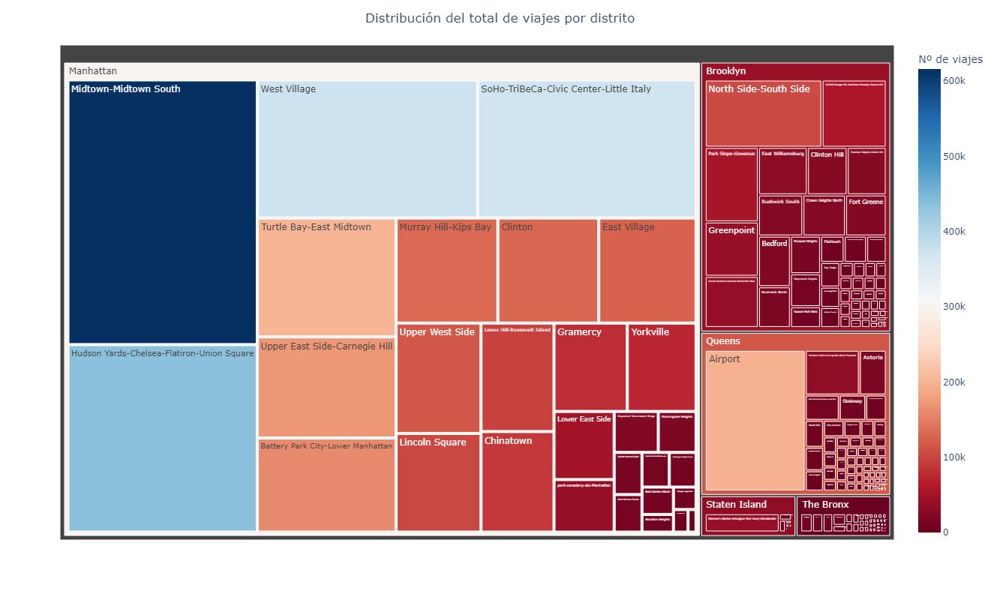

In [32]:
# Treemap con el total de viajes por distrito
fig = px.treemap(uber_nbhood, path=['borough', 'nbhood'], values='total_picks',
                 # Paleta de colores
                 color='total_picks', hover_data=['nbhood'], color_continuous_scale='RdBu')

fig.update_layout(
    # Título y nombre de leyenda
    title='Distribución del total de viajes por distrito', title_x=0.5,
    coloraxis_colorbar=dict(title='Nº de viajes'),
    
    # Ajuste del tamaño del gráfico
    width=1200, height=800
)

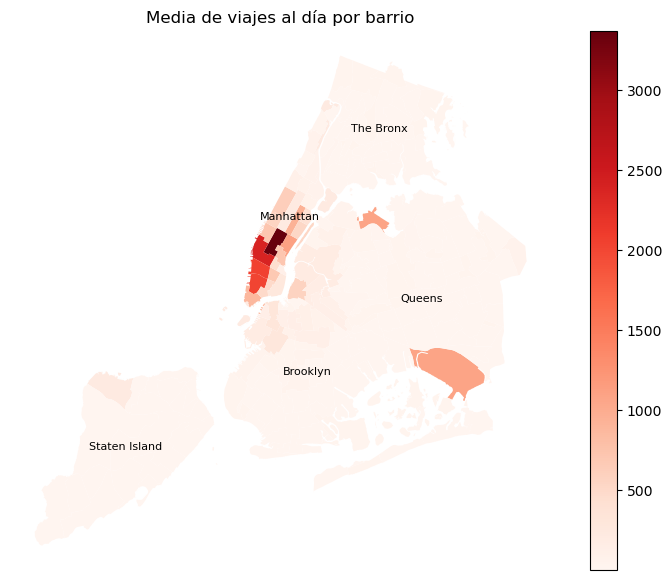

In [33]:
fig, ax = plt.subplots(figsize=(10, 7)) # Ajuste del tamaño del gráfico

# Mapa con la media diaria de viajes por barrio
uber_nbhood.plot(column='mean_picks', cmap='Reds', legend=True, ax=ax)

# Título del gráfico
plt.title('Media de viajes al día por barrio')

# Eliminación del eje x e y
plt.axis('off')

# Bucle para agregar etiquetas en los distritos
for x, y, label in zip(uber_borough.geometry.centroid.x, uber_borough.geometry.centroid.y, uber_borough['borough']):
    ax.text(x, y, label, fontsize=8, ha='center', va='center')

plt.show()

<div style="border: 5px solid #000000; padding: 20px; font-size: 16px; background-color: rgba(0, 0, 0, 0.1);">
Dada la alta cantidad de viajes que se realizan en Manhattan, es lógico señalar que la mayoría de los barrios con el mayor número de viajes se encuentran en Manhattan. De hecho, observando los datos, 9 de los 10 barrios con más viajes pertenecen a Manhattan. El área geográfica restante de este ranking es el aeropuerto de Queens, lo que es significativo porque resalta la importancia de atender y satisfacer a los viajeros que llegan y salen de la ciudad vía aérea.
</div>

#### 3.2 - Mapa de calor con el total de viajes por barrio en cada distrito

In [34]:
# Nombres de los distritos
borough_names = ['Manhattan', 'Brooklyn', 'Queens', 'The Bronx', 'Staten Island']

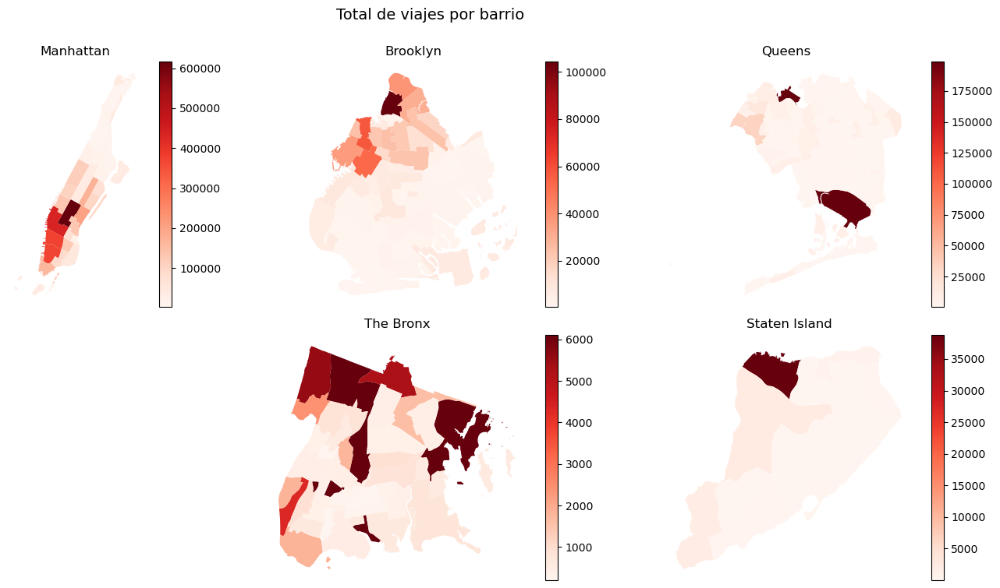

In [35]:
# Figura con 6 subplots
fig = plt.figure(figsize=(15, 7.5))
gs = gridspec.GridSpec(2, 3)

# Título del subplot
plt.suptitle('Total de viajes por barrio', y=1, fontsize=14)

# Bucle para obtener el total de viajes por barrio para cada distrito
for i, borough in enumerate(borough_names):
    
    # Datos filtrados para cada distrito
    subset = uber_nbhood[uber_nbhood['borough'] == borough]
    
    # Selección del subplot correspondiente
    if i < 3: ax = fig.add_subplot(gs[0, i])
    else: ax = fig.add_subplot(gs[1, i-2])

    # Mapa con el total de viajes por barrio para cada distrito
    subset.plot(column='total_picks', cmap='Reds', legend=True, ax=ax)
    
    # Título y etiqueta de los ejes
    ax.set_title(f'{borough}')
    # Eliminación del eje x e y
    ax.axis('off')

plt.tight_layout() # Ajuste del espaciado entre subplots
plt.show()

<div style="border: 5px solid #000000; padding: 20px; font-size: 16px; background-color: rgba(0, 0, 0, 0.1);">
Expandirse hacia los barrios cercanos donde Uber ya tiene una posición establecida y una actividad significativa puede ser una estrategia beneficiosa para continuar impulsando el crecimiento de la empresa.
</div>

#### 3.3 - Relación entre la media diaria de viajes y la densidad por barrio

In [36]:
# Conversión de pies cuadrados a metros cuadrados
uber_nbhood['area_m2'] = uber_nbhood['area_sqft'] * 0.092903

# Densidad
uber_nbhood['density'] = uber_nbhood['population'] / uber_nbhood['area_m2']

In [37]:
# Paleta de colores
borough_palette = {'Manhattan':'#7356BF', 'Brooklyn':'#FFC043', 'Queens':'#276EF1', 'The Bronx':'#ED6E33', 'Staten Island':'#3AA76D'}

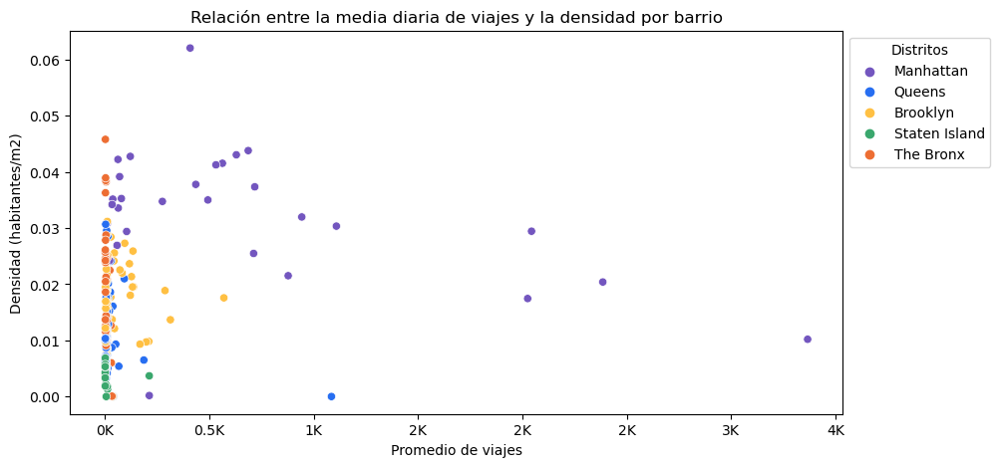

In [38]:
fig, ax = plt.subplots(figsize=(10, 5)) # Ajuste del tamaño del gráfico

# Gráfico de dispersión con la media diaria de viajes y la población por barrio
sns.scatterplot(x='mean_picks', y='density', hue='borough', data=uber_nbhood, palette=borough_palette)

# Título y etiquetas de ejes
plt.title('Relación entre la media diaria de viajes y la densidad por barrio')
plt.xlabel('Promedio de viajes')
plt.ylabel('Densidad (habitantes/m2)')
# Formato del eje x
ax.xaxis.set_major_formatter(ticker.FuncFormatter(format_labels_k))

# Leyenda
plt.legend(title='Distritos', loc='upper left', bbox_to_anchor=(1,1))

plt.show()

<div style="border: 5px solid #000000; padding: 20px; font-size: 16px; background-color: rgba(0, 0, 0, 0.1);">
Incorporando la densidad poblacional al análisis, no se observa una correlación significativa entre esta variable y la variación del número de viajes por barrio, ya sea un aumento o una disminución.
</div>

#### 3.4 - Comparativa mensual del total de viajes por barrio en cada distrito

In [39]:
# Total de viajes por mes y por barrio
uber_month_nbhood = df_uber.groupby(['n_month','month','nbhood']).agg(total_picks=('n_picks','sum')).round(2)
uber_month_nbhood = uber_month_nbhood.sort_values(by=['n_month','total_picks'], ascending=[True,False]).reset_index()

uber_month_nbhood

,n_month,month,nbhood,total_picks
0,4,abr,Midtown-Midtown South,84908
1,4,abr,Hudson Yards-Chelsea-Flatiron-Union Square,58327
2,4,abr,West Village,53622
3,4,abr,SoHo-TriBeCa-Civic Center-Little Italy,52866
4,4,abr,Turtle Bay-East Midtown,26568
...,...,...,...,...
1152,9,sep,Oakwood-Oakwood Beach,4
1153,9,sep,New Dorp-Midland Beach,3
1154,9,sep,Arden Heights,2
1155,9,sep,Great Kills,1


In [40]:
# Combinación con el geodataframe de barrios
uber_month_nbhood = gdf_nyc_nbhoods[['borough','nbhood','geometry']].merge(uber_month_nbhood, how='left', left_on='nbhood', right_on='nbhood')

# Eliminación de nulos (Rikers Island)
uber_month_nbhood = uber_month_nbhood.dropna()

In [41]:
# Nombres de los meses
month_names = ['abr', 'may', 'jun', 'jul', 'ago', 'sep']

In [42]:
# Máximo de viajes por distrito
max_picks_borough = uber_month_nbhood.groupby('borough')['total_picks'].max()

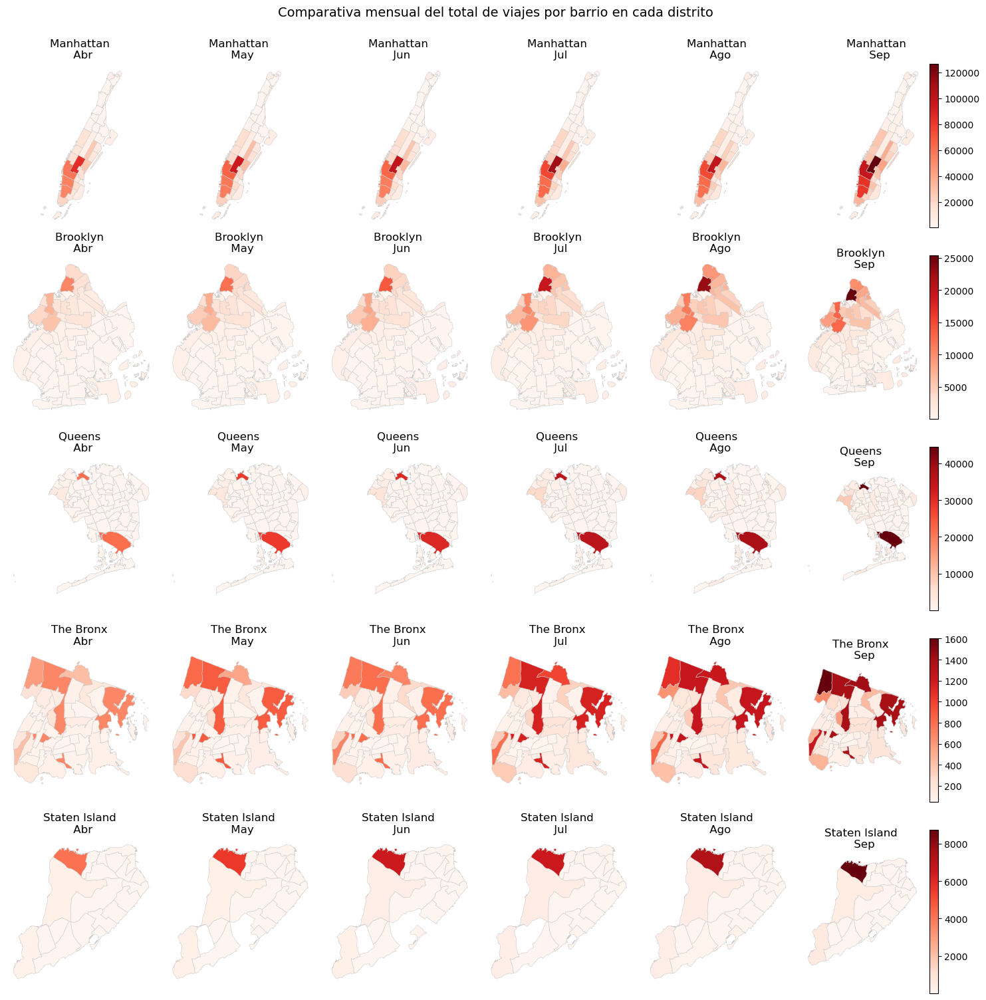

In [43]:
# Figura con 30 subplots
fig = plt.figure(figsize=(15, 15))
gs = gridspec.GridSpec(5, 6)

# Título del subplot
fig.suptitle('Comparativa mensual del total de viajes por barrio en cada distrito', y=1, fontsize=14)

# Bucle para obtener el total de viajes por barrio para cada mes y distrito
for i, borough in enumerate(borough_names):
    for j, month in enumerate(month_names):
        
        # Datos filtrados para cada mes y distrito
        subset = uber_month_nbhood[(uber_month_nbhood['borough'] == borough) & (uber_month_nbhood['month'] == month)]
        
        # Selección de subplot actual correspondiente
        ax = plt.subplot(gs[i, j])

        # Mapa con el total de viajes para cada mes y distrito
        subset.plot(column='total_picks', cmap='Reds', edgecolor='0.8', linewidth=0.4, legend=(j == len(month_names)-1), vmax=max_picks_borough[borough], ax=ax)
        
        # Título y etiquetas de los ejes
        ax.set_title(f'{borough} \n {month.capitalize()}')
        ax.axis('off')

plt.tight_layout() # Ajuste del espaciado entre subplots
plt.show()

#### 3.5 - Comparativa semanal del total de viajes por barrio en cada distrito

In [44]:
# Total de viajes por mes y por barrio
uber_week_nbhood = df_uber.groupby(['n_day_week','day_week','nbhood']).agg(total_picks=('n_picks','sum')).round(2)
uber_week_nbhood = uber_week_nbhood.reset_index()

In [45]:
# Combinación con el geodataframe de barrios
uber_week_nbhood = gdf_nyc_nbhoods[['borough','nbhood','geometry']].merge(uber_week_nbhood, how='left', left_on='nbhood', right_on='nbhood')

# Eliminación de nulos (Rikers Island)
uber_week_nbhood = uber_week_nbhood.dropna()

In [46]:
# Nombres de los meses
day_week_names = ['lun', 'mar', 'mie', 'jue', 'vie', 'sab', 'dom']

In [47]:
# Máximo de viajes por distrito
max_picks_borough = uber_week_nbhood.groupby('borough')['total_picks'].max()

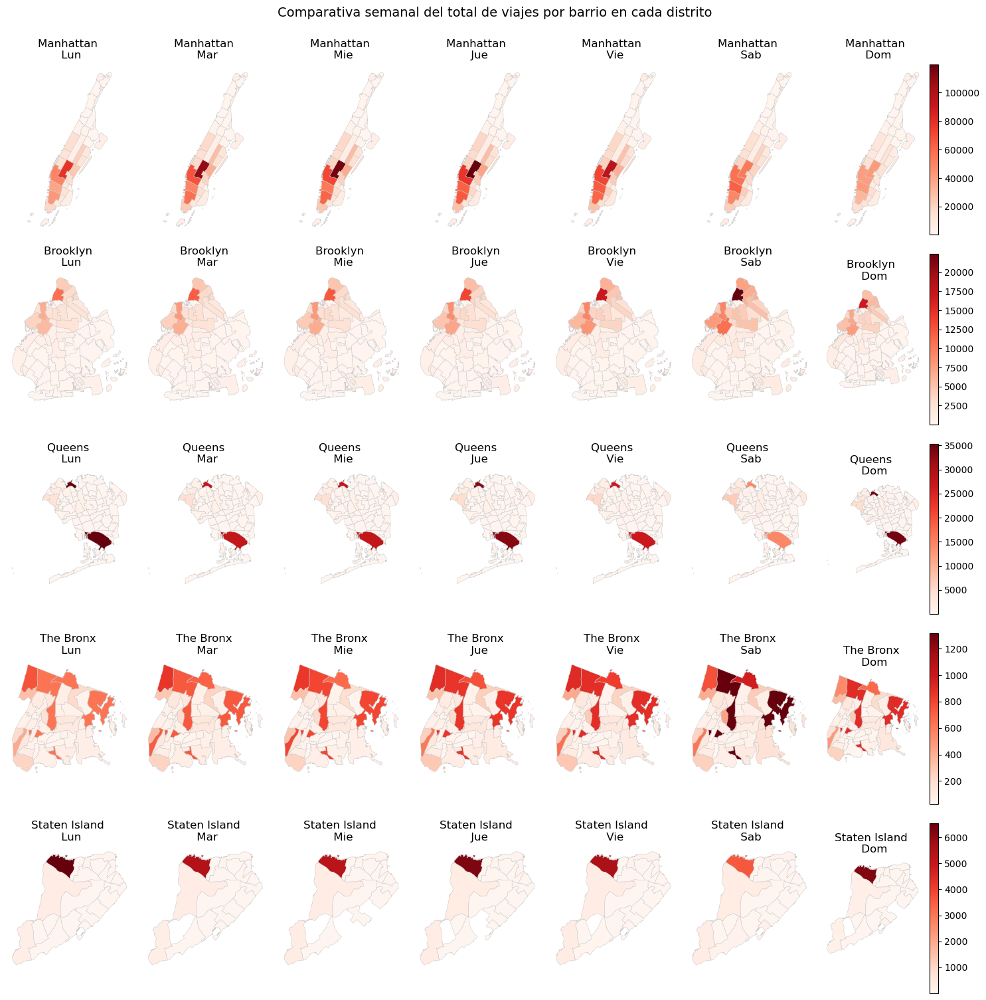

In [48]:
# Figura con 35 subplots
fig = plt.figure(figsize=(15, 15))
gs = gridspec.GridSpec(5, 7)

# Título del subplot
fig.suptitle('Comparativa semanal del total de viajes por barrio en cada distrito', y=1, fontsize=14)

# Bucle para obtener el total de viajes por barrio para cada día de la semana y distrito
for i, borough in enumerate(borough_names):
    for j, day_week in enumerate(day_week_names):
        
        # Datos filtrados para cada día de la semana y distrito
        subset = uber_week_nbhood[(uber_week_nbhood['borough'] == borough) & (uber_week_nbhood['day_week'] == day_week)]
        
        # Selección de subplot actual correspondiente
        ax = plt.subplot(gs[i, j])

        # Mapa con el total de viajes para cada día de la semana y distrito
        subset.plot(column='total_picks', cmap='Reds', edgecolor='0.8', linewidth=0.4, legend=(j == len(day_week_names)-1), vmax=max_picks_borough[borough], ax=ax)
        
        # Título y etiquetas de los ejes
        ax.set_title(f'{borough} \n {day_week.capitalize()}')
        ax.axis('off')

plt.tight_layout() # Ajuste del espaciado entre subplots
plt.show()

---
### **4 - Análisis de viajes por base**

#### 4.1 - Distribución del total de viajes por base

In [49]:
# Total de viajes al día por base
uber_base_date = df_uber.groupby(['base','date']).agg({'n_picks':'sum'}).reset_index()

# Total y media diaria de viajes por base
uber_base = uber_base_date.groupby('base').agg(total_picks=('n_picks','sum'), mean_picks=('n_picks','mean')).round(2)
uber_base = uber_base.sort_values(by='total_picks', ascending=False).reset_index()

uber_base

,base,total_picks,mean_picks
0,B02617,1458853,7971.87
1,B02598,1393113,7612.64
2,B02682,1212789,6627.26
3,B02764,263899,1442.07
4,B02512,205673,1123.90


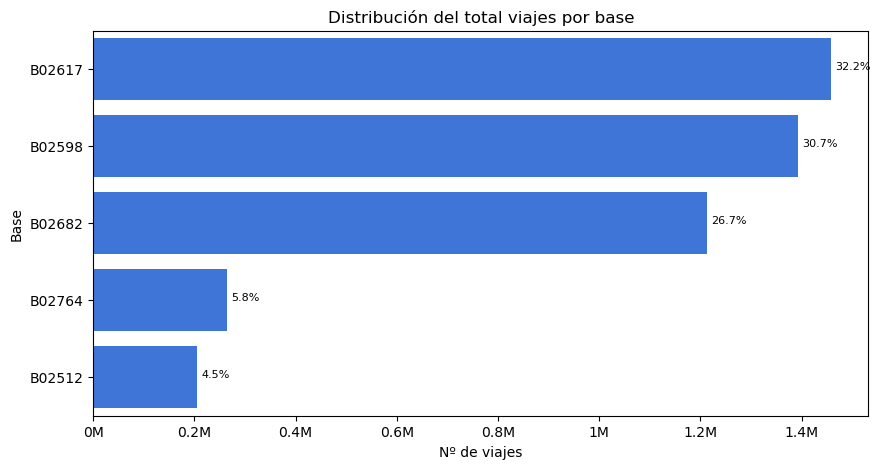

In [50]:
fig, ax = plt.subplots(figsize=(10, 5)) # Ajuste del tamaño del gráfico

# Gráficos de barras con el total de viajes por base
sns.barplot(x='total_picks', y='base', data=uber_base, color='#276EF1')

# Bucle para agregar etiquetas del porcentaje de viajes por base
for bar in ax.containers[0]:
    
    # Cálculo del porcentaje de viajes por base
    per_picks = (bar.get_width() / total_picks) * 100
    
    # Anotación de la etiqueta
    ax.annotate(f'{per_picks:.1f}%', xy=(bar.get_width(), bar.get_y() + bar.get_height() / 2), xytext=(3, 0), textcoords='offset points', fontsize=8)

# Título y etiquetas de los ejes
plt.title('Distribución del total viajes por base')
plt.xlabel('Nº de viajes')
plt.ylabel('Base')
# Formato del eje x
ax.xaxis.set_major_formatter(plt.FuncFormatter(format_labels_m))

plt.show()

<div style="border: 5px solid #000000; padding: 20px; font-size: 16px; background-color: rgba(0, 0, 0, 0.1);">
Centrándonos en la operatividad de las bases, se puede observar que tres de ellas (B02617, B02598 y B02682) están siendo ampliamente utilizadas, mientras que las dos restantes (B02764 y B02512) muestran un nivel de utilización mucho más bajo en comparación.
</div>

#### 4.2 - Evolución mensual del total viajes por base

In [51]:
# Total de viajes por mes en cada base
uber_base_month = df_uber.groupby(['base','n_month','month']).agg(total_picks=('n_picks','sum')).round(2)
uber_base_month = uber_base_month.sort_values(by=['n_month','total_picks'], ascending=[True,False]).reset_index()

In [52]:
# Paleta de colores
base_cmap = {'B02617':'#FFC043', 'B02598':'#3AA76D', 'B02682':'#276EF1', 'B02764':'#7356BF', 'B02512':'#ED6E33'}

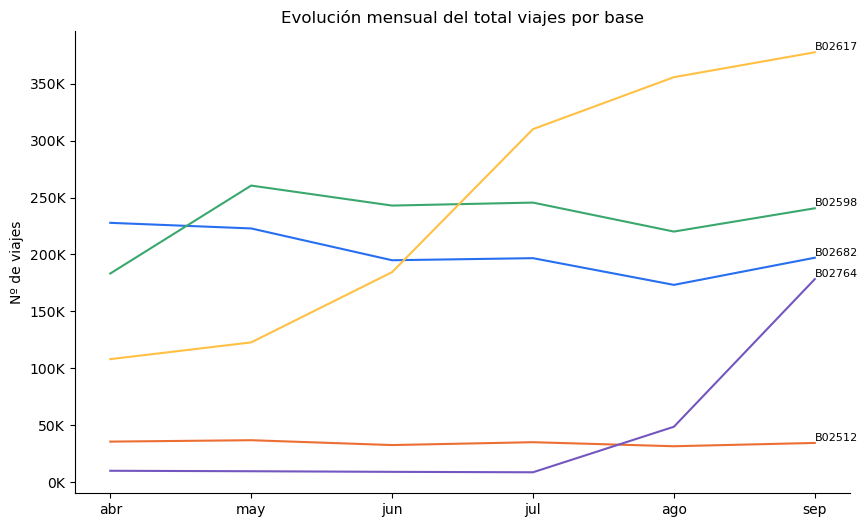

In [53]:
plt.figure(figsize=(10, 6)) # Ajuste del tamaño del gráfico

# Gráfico de líneas con el total de viajes por mes en cada base
sns.lineplot(x='month', y='total_picks', hue='base', data=uber_base_month, palette=base_cmap)

# Título y etiqueta de los ejes
plt.title('Evolución mensual del total viajes por base')
plt.xlabel(None)
plt.ylabel('Nº de viajes')
# Formato del eje y
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(format_labels_k))

# Eliminación de leyenda predeterminada
plt.legend().remove()

# Nombres de las bases
base_names = uber_base_month['base'].unique()

# Bucle para agregar etiquetas de la base al final de cada línea
for line, name in zip(plt.gca().get_lines(), base_names):
    
    # Último valor de cada línea
    x = line.get_xdata()[-1]
    y = line.get_ydata()[-1]
    
    # Leyenda de cada línea
    plt.text(x, y, name, ha='left', va='bottom', fontsize=8)

sns.despine() # Eliminación de bordes

<div style="border: 5px solid #000000; padding: 20px; font-size: 16px; background-color: rgba(0, 0, 0, 0.1);">
A lo largo de estos meses, las bases B02598 y B02617 han mantenido niveles de actividad relativamente estables. La base B02512 también ha mantenido un nivel de actividad estable, aunque significativamente más bajo en comparación con las otras dos.
<br><br>
En contraste, las bases B02617 y B02764 han experimentado un crecimiento a medida que han avanzado los meses, con un aumento notable en el número de recogidas.
</div>

#### 4.3 - Evolución semanal de la media diaria de viajes por base

In [54]:
# Total de viajes al día por base
uber_base_week_date = df_uber.groupby(['base','date','n_day_week','day_week']).agg({'n_picks':'sum'}).reset_index()

# Media de viajes diarios por día de la semana y por base
uber_base_week = uber_base_week_date.groupby(['base','n_day_week','day_week']).agg(total_picks=('n_picks','sum'), mean_picks=('n_picks','mean')).round(2)
uber_base_week = uber_base_week.sort_values(by=['n_day_week','mean_picks'], ascending=[True,False]).reset_index()

In [55]:
# Nombres de las bases
base_names = uber_base_week['base'].unique()

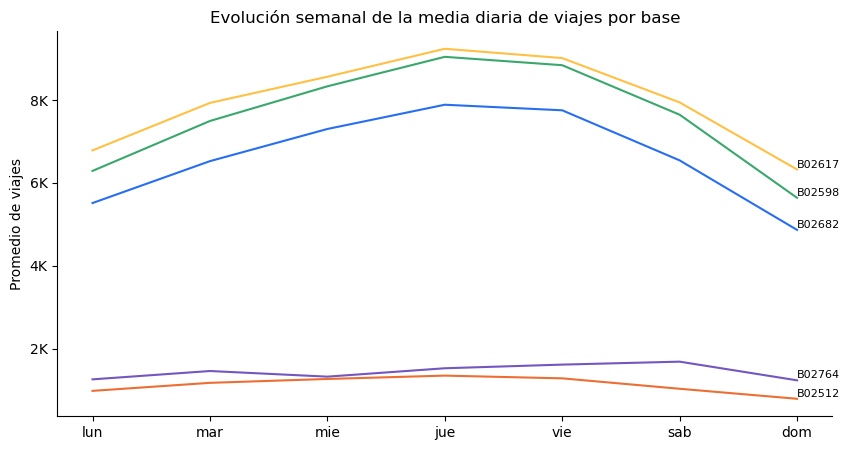

In [56]:
plt.figure(figsize=(10, 5)) # Ajuste del tamaño del gráfico

# Gráfico de líneas con el total de viajes por día de la semana y por base 
sns.lineplot(x='day_week', y='mean_picks', hue='base', data=uber_base_week, palette=base_cmap)

# Título y etiqueta de los ejes
plt.title('Evolución semanal de la media diaria de viajes por base')
plt.xlabel(None)
plt.ylabel('Promedio de viajes')
# Formato del eje y
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(format_labels_k))

# Eliminación de leyenda predeterminada
plt.legend().remove()

# Bucle para agregar etiquetas de la base al final de cada línea
for line, name in zip(plt.gca().get_lines(), base_names):
    
    # Último valor de cada línea
    x = line.get_xdata()[-1]
    y = line.get_ydata()[-1]
    
    # Leyenda de cada línea
    plt.text(x, y, name, ha='left', va='bottom', fontsize=8)

sns.despine() # Eliminación de bordes

#### 4.4 - Evolución horaria de la media diaria de viajes por base

In [57]:
# Total de viajes al día por hora y por base
uber_base_date_hour = df_uber.groupby(['base','date','hour']).agg({'n_picks':'sum'}).reset_index()

# Total y media diario de viajes por hora y por base
uber_base_hour = uber_base_date_hour.groupby(['base','hour']).agg(total_picks=('n_picks','sum'), mean_picks=('n_picks','mean')).round(2)
uber_base_hour = uber_base_hour.sort_values(by=['hour','mean_picks'], ascending=[True,False]).reset_index()

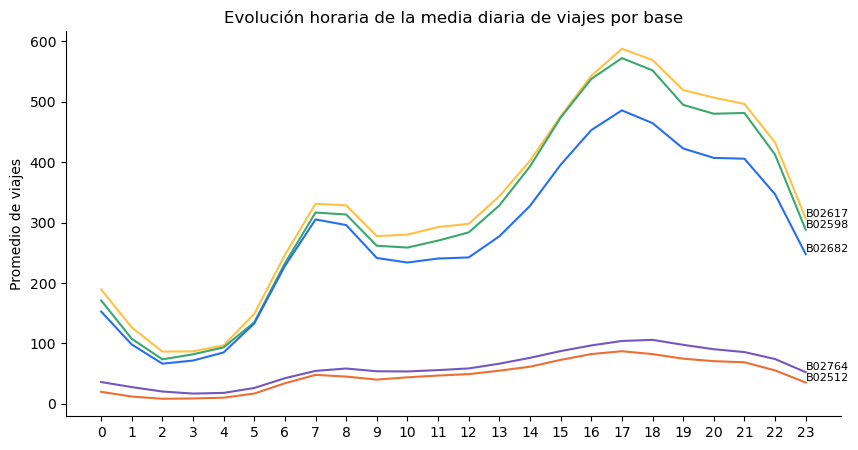

In [58]:
plt.figure(figsize=(10, 5)) # Ajuste del tamaño del gráfico

# Gráfico de líneas con la media de viajes diarios por hora en cada base
sns.lineplot(x='hour', y='mean_picks', hue='base', data=uber_base_hour, palette=base_cmap)

# Título y etiqueta de los ejes
plt.title('Evolución horaria de la media diaria de viajes por base')
plt.xlabel(None)
plt.ylabel('Promedio de viajes')
plt.xticks(range(24))

# Eliminación de leyenda predeterminada
plt.legend().remove()

# Bucle para agregar etiquetas de la base al final de cada línea
for line, name in zip(plt.gca().get_lines(), base_names):
    
    # Último valor de cada línea
    x = line.get_xdata()[-1]
    y = line.get_ydata()[-1]
    
    # Leyenda de cada línea
    plt.text(x, y, name, ha='left', va='bottom', fontsize=8)

sns.despine() # Eliminación de bordes

<div style="border: 5px solid #000000; padding: 20px; font-size: 16px; background-color: rgba(0, 0, 0, 0.1);">
La evolución semanal y horaria de los viajes en cada una de las bases muestra una variación en el volumen de viajes, pero los patrones de uso a nivel semanal y horario son notoriamente similares entre todas las bases.
</div>